# Семинар 1. Меры центральности, NetworkX

**План**
- Немного организационной информации
- Повторим меры центральности
- Немного поговрим про меры кластерности (не путать с кластеризацией, как алгоритмом!)

In [1]:
import networkx as nx
from matplotlib import pyplot as plt
from tqdm.notebook import tqdm
import numpy as np
import pandas as pd

## Посмотрим на данные

У нас есть датафрейм с данными, содержащими информацию о совместной встречаемости разных сущностей (иногда именованых) в фанфиках по Гарри Поттеру с сайта https://fanfics.me/ 

По составу датафрейма:
- в столбцах `entity1` и `entity2` записаны имена сущностей,
- в столбце `freq` записана абсолютная частота совместной встречаемости,
- в столбце `similarity` записана косинусная близость по модели word2vec (если кому-то интересно, что это была за модель и почему я ей верю, то можете спросить или прочитать [вот здесь](https://www.dialog-21.ru/media/5882/zykovaviplusklyshinskyes105.pdf))

In [2]:
df = pd.read_csv('hp_data.csv')
df.head()

,entity1,entity2,freq,similarity
0,гарри,рука,28566,0.328119
1,гарри,голова,23447,0.277251
2,гарри,глаз,22313,0.280000
3,взгляд,гарри,20805,0.285512
4,голова,мысль,20046,0.295762


Давайте нарисуем какие-то графики и подумаем, как нам из этого строить граф

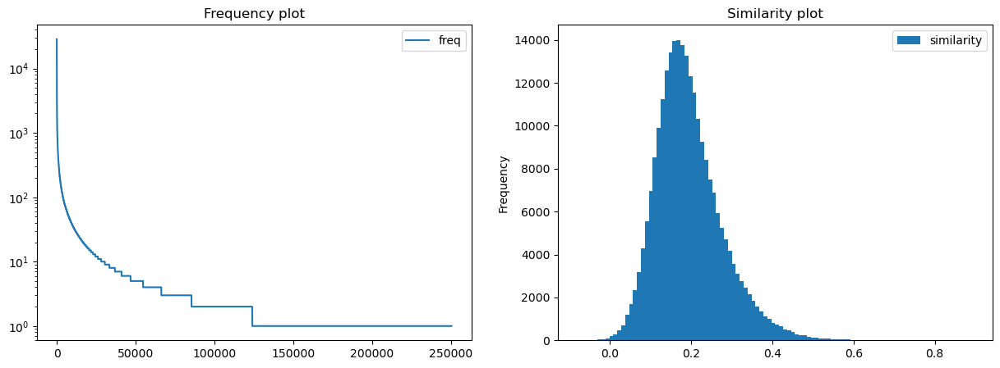

In [3]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
df.freq.plot(ax=axs[0], logy=True, legend=True, title='Frequency plot')
df.similarity.plot(kind='hist', ax=axs[1], legend=True, title='Similarity plot', bins=100)
pass

Теперь построим граф:
- оставим все пары, где близость выше определенного порога (я возьму 0.5, с другими вы можете поэкспериментировать сами)
- переведем их в граф через функцию networkx

В целом, логика работы с данной библиотекой выглядит следующим образом: 
- Придумываете, как на языке графов называется то, что вам нужно сделать
- Идете гуглить и/или листать документацию

Там честно реализовано почти все, что вам может понадобиться :)

In [4]:
small_df = df[df.similarity > 0.5].reset_index(drop=True)
small_df.shape

(803, 4)

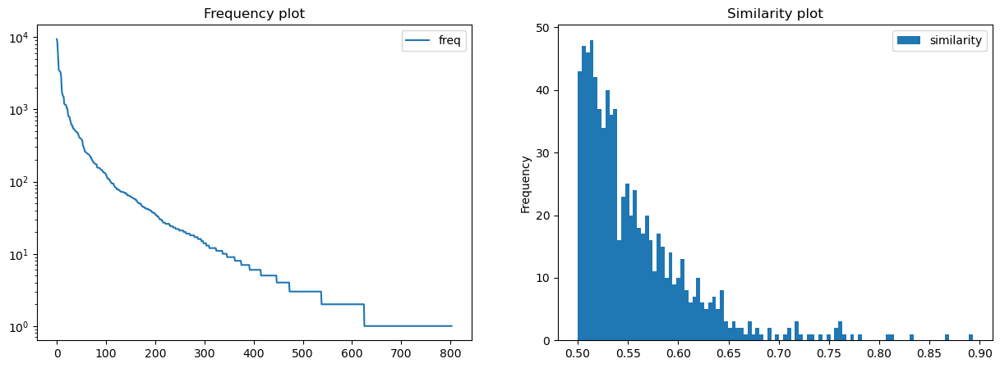

In [5]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
small_df.freq.plot(ax=axs[0], logy=True, legend=True, title='Frequency plot')
small_df.similarity.plot(kind='hist', ax=axs[1], legend=True, title='Similarity plot', bins=100)
pass

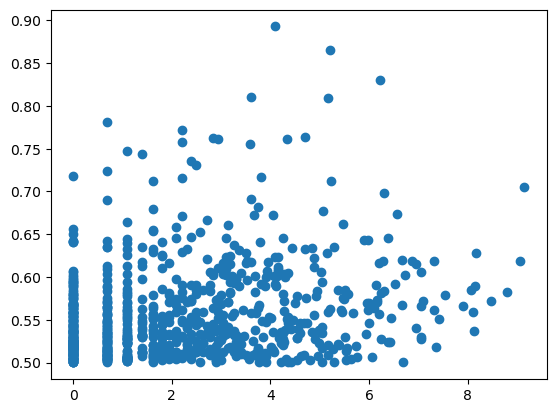

In [6]:
plt.scatter(np.log(small_df.freq), small_df.similarity)

## Строим граф

In [7]:
g = nx.from_pandas_edgelist(small_df, source='entity1', target='entity2', edge_attr='similarity')
g.number_of_edges(), g.number_of_nodes(), nx.number_connected_components(g)

(803, 590, 88)

Посмотрим, что за граф у нас получился

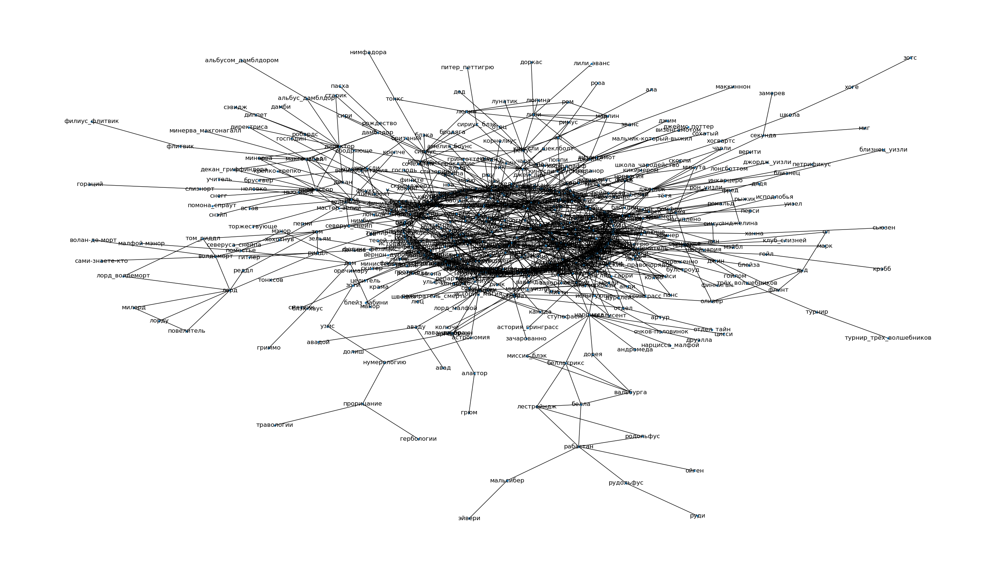

In [8]:
fig, ax = plt.subplots(1, figsize=(35, 20))
nx.draw(g, ax=ax, with_labels=True, arrows=True, node_size=10, pos=nx.kamada_kawai_layout(g))

Что-то он какой-то большой и некрасивый. Это не всегда страшно, но мы сейчас хотим скорее посмотреть на что-то интересное, чем помучиться, так что давайте оставим самую большую компоненту связности, чтобы было удобнее

193


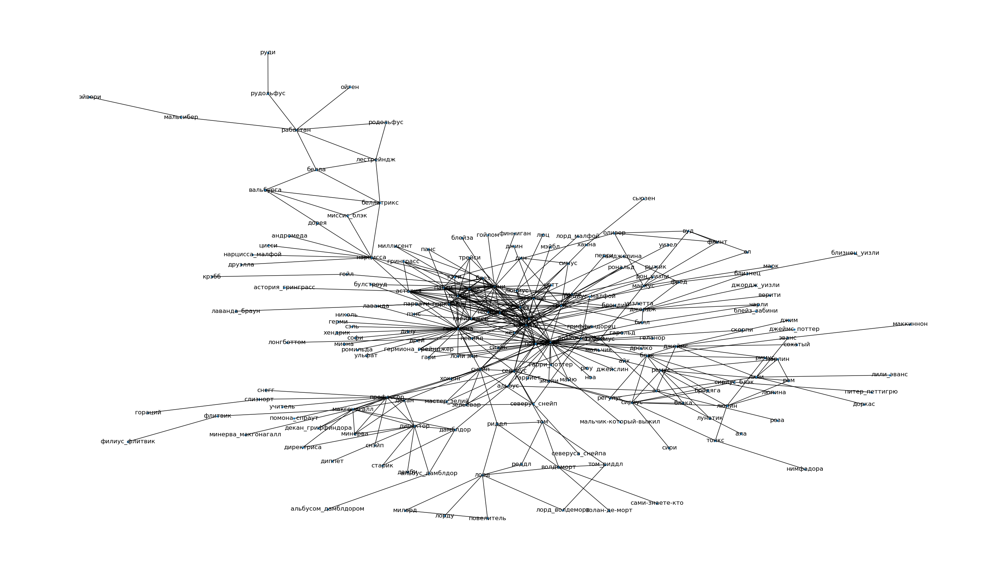

In [9]:
lg = [g.subgraph(c).copy() for c in sorted(nx.connected_components(g), key=len, reverse=True)][0]
print(lg.number_of_nodes())

fig, ax = plt.subplots(1, figsize=(35, 20))
nx.draw(lg, ax=ax, with_labels=True, arrows=True, node_size=10, pos=nx.kamada_kawai_layout(lg))

## Изучаем получившийся граф

Давайте посмотрим, что нам дадут изученные на лекции меры центральности при анализе полученного графа.

Все они уже есть в networkx, поэтому будем пользоваться встроенными штуками

Нужная страница документации: https://networkx.org/documentation/stable/reference/algorithms/centrality.html

In [10]:
def draw_graph(g, sizes=None, power=1000):
    fig, ax = plt.subplots(1, figsize=(35, 20))
    if not isinstance(sizes, int):
        nx.draw(g, 
                ax=ax, 
                with_labels=True,
                nodelist=sizes.keys(), 
                node_size=[v * power for v in sizes.values()],
                pos=nx.kamada_kawai_layout(g))
    else:
        nx.draw(g, 
                ax=ax, 
                with_labels=True,
                node_size=sizes,
                pos=nx.kamada_kawai_layout(g))
    plt.show()

***
- **Degree centrality** - на самом деле всего лишь рейтинг вершин по их степени (кол-ву инцидентных ребер), пусть и нормализованной

Ожидаемо получаем главных героев в вершине рейтинга. На самом деле, это очень простая оценка, которая при сложной структуре графа мало чем может помочь, но с нее полезно начинать

In [11]:
ct = nx.degree_centrality(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.19270833333333331),
 ('гермиона', 0.17708333333333331),
 ('малфой', 0.16666666666666666),
 ('драко', 0.140625),
 ('забини', 0.13020833333333331),
 ('рон', 0.109375),
 ('поттер', 0.09895833333333333),
 ('блейз', 0.09375),
 ('дафна', 0.08333333333333333),
 ('панси', 0.08333333333333333)]

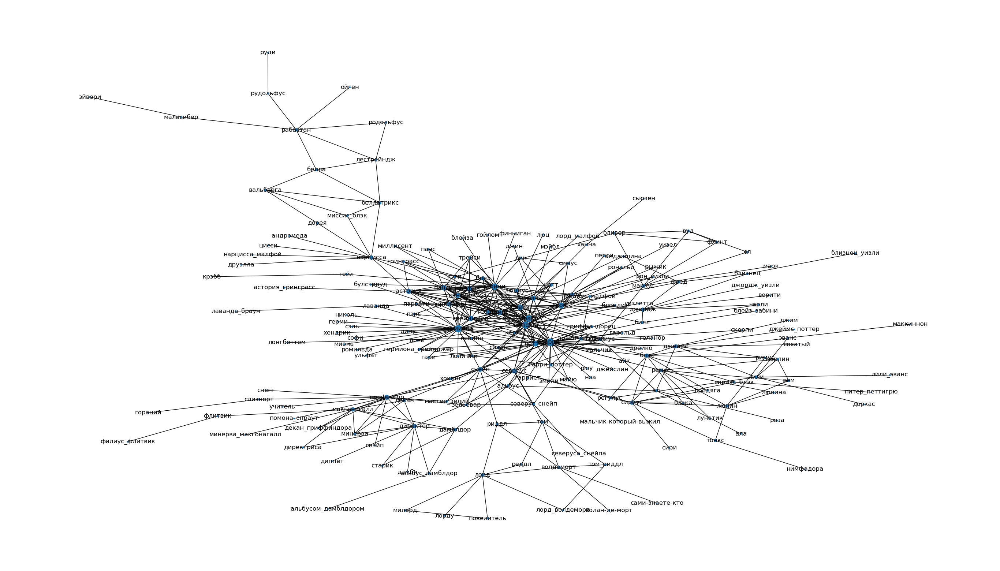

In [12]:
draw_graph(lg, ct)

***
- **Closeness centrality** - число, обатное среднему кратчайшему пути от данной вершины до всех остальных вершин в графе (для связного графа)

$C(u) = \frac{n - 1}{\sum_{v=1}^{n-1} d(v, u)}$, где
 - u - текущая вершина
 - d(v, u) - кратчайший путь между вершинами v и u
 - n - кол-во вершин в графе
 
 Для нашего графа оно оказывается даже чуть менее интересным, чем степень вершины: слишком маленький разброс между значениями для различных вершин.

In [13]:
ct = nx.closeness_centrality(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.4146868250539957),
 ('малфой', 0.4),
 ('драко', 0.3950617283950617),
 ('гермиона', 0.38866396761133604),
 ('поттер', 0.3779527559055118),
 ('северус', 0.375),
 ('снейп', 0.3650190114068441),
 ('блейз', 0.35555555555555557),
 ('джинни', 0.35359116022099446),
 ('тео', 0.3510054844606947)]

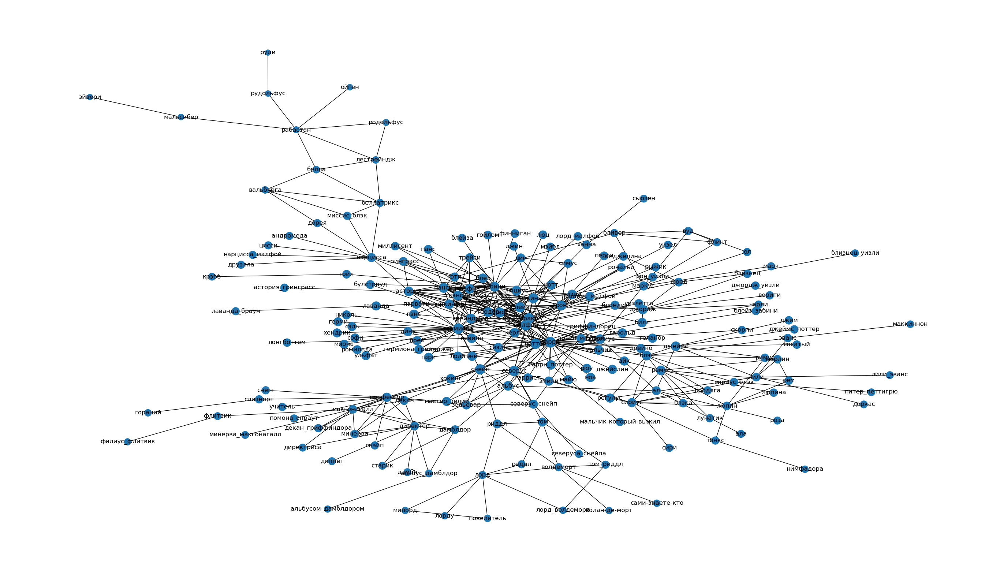

In [14]:
draw_graph(lg, ct)

Посмотрим еще на взвешенную версию

In [15]:
ct = nx.closeness_centrality(lg, distance='similarity')
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.7617285098069299),
 ('малфой', 0.7358485672840006),
 ('гермиона', 0.706652016598498),
 ('драко', 0.704011690090647),
 ('северус', 0.6900117061715036),
 ('поттер', 0.687751558289723),
 ('блейз', 0.6615738548226089),
 ('снейп', 0.660361452673281),
 ('джинни', 0.6504870331918697),
 ('тео', 0.6504659861827504)]

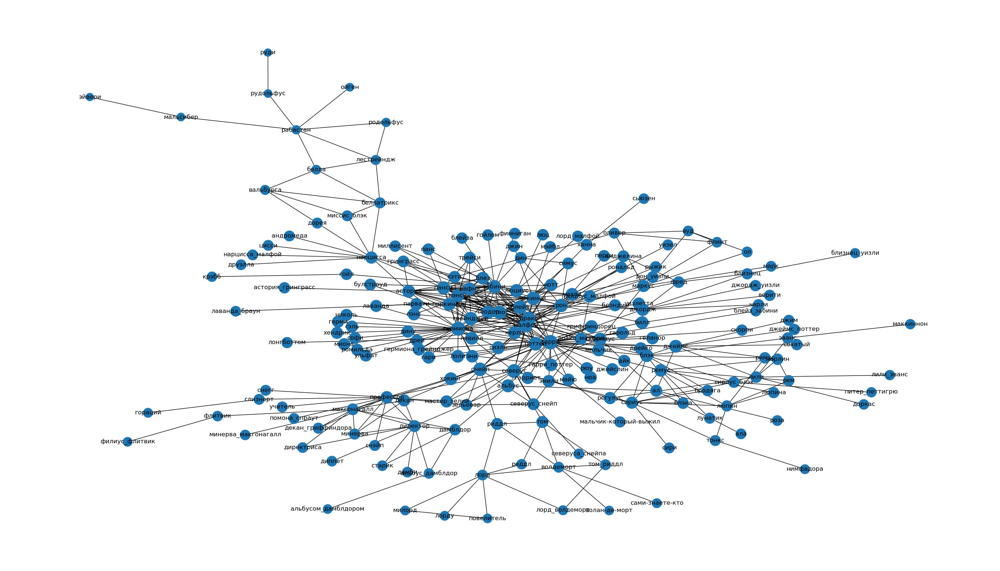

In [16]:
draw_graph(lg, ct)

***
- **Betweenness centrality** - доля кратчайших путей в графе, которые проходят через данную вершину.

$c_B(v) =\sum_{s,t \in V} \frac{\sigma(s, t|v)}{\sigma(s, t)}$, где
 - V - множество вершин графа
 - s, t - пара вершин из множества V
 - ${\sigma(s, t)}$ - кол-во кратчайших путей между s и t. Почему это имеет смысл: в большом графе может быть много различных путей между s и t таких, что их длины равны между собой и равны длине кратчайшего пути между s и t
 - ${\sigma(s, t|v)}$ - кол-во кратчайших путей между s и t, проходщих через текущую вершину v
 
 Заметим, что для нашего графа эта оценка внезапно дает результаты, отличающиеся от предыдущих. Почему так происходит? Кого нам выделяет мера центральности?

In [17]:
ct = nx.betweenness_centrality(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.3064563595378814),
 ('нарцисса', 0.16579361183827807),
 ('гермиона', 0.165612670578564),
 ('северус', 0.15561869188417596),
 ('малфой', 0.1510967672681165),
 ('снейп', 0.1299851352319209),
 ('драко', 0.11836288304588037),
 ('профессор', 0.09966462995418451),
 ('люциус', 0.09601047139327663),
 ('беллатрикс', 0.09208660558464238)]

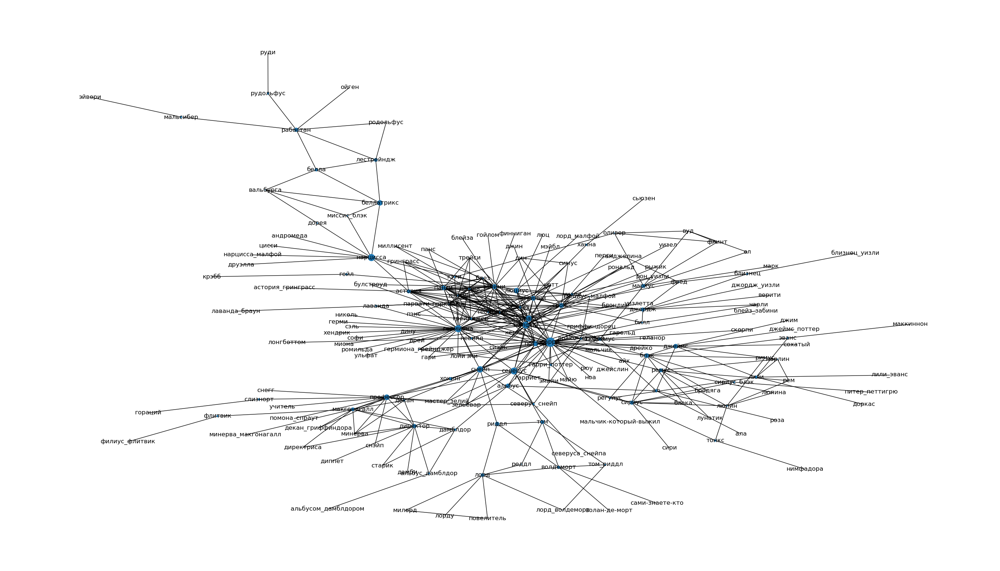

In [18]:
draw_graph(lg, ct)

Для взвешенного графа

In [19]:
ct = nx.betweenness_centrality(lg, weight='similarity')
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.32711605584642234),
 ('северус', 0.18270069808027922),
 ('нарцисса', 0.16644851657940662),
 ('гермиона', 0.15401396160558464),
 ('малфой', 0.14201570680628273),
 ('поттер', 0.12843586387434555),
 ('люциус', 0.10716623036649214),
 ('беллатрикс', 0.09838568935427575),
 ('панси', 0.08464223385689354),
 ('профессор', 0.07891579406631763)]

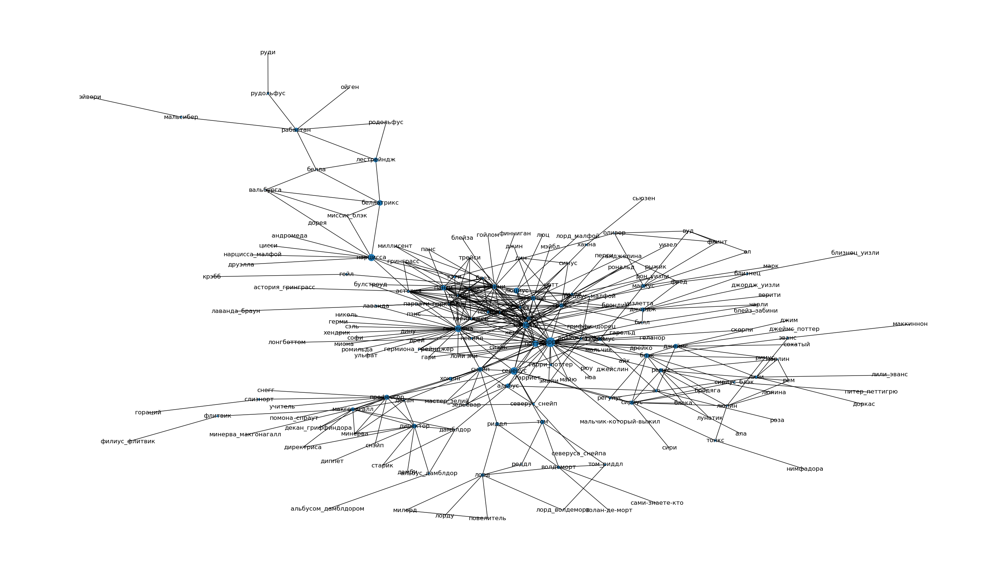

In [20]:
draw_graph(lg, ct)

Вообще, есть еще очень похожая на betweenness centrality мера load centrality (которая вообще-то Newman's betweenness centrality). [Вот тут](https://arxiv.org/abs/cond-mat/0309045) можно прочитать про нее подробнее.

В двух словах:

- Данная метрика считается методом случайных блужданий: начиная из вершины s мы каждый раз переходим по случайному ребру, пока не достигнем вершины t. 
- Случайные блуждания запускаются много раз, после чего мера центральности считается как доля путей, прошедших через интересующую нас вершину.

Очевидно, что при определенных обстоятельствах и достаточном количестве запусков эта метрика сходится к shortest-path betweenness centrality, которую мы обсуждали выше, однако интересно смотреть именно на ситуации, когда они непохожи друг на друга

In [21]:
ct = nx.load_centrality(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.3098512711892814),
 ('нарцисса', 0.16584143704971585),
 ('гермиона', 0.16480992789811516),
 ('северус', 0.15473380955194405),
 ('малфой', 0.14705696270892454),
 ('снейп', 0.12731247208198296),
 ('драко', 0.11287678660200608),
 ('люциус', 0.09854694212310383),
 ('профессор', 0.09758775166613566),
 ('беллатрикс', 0.09207297120418864)]

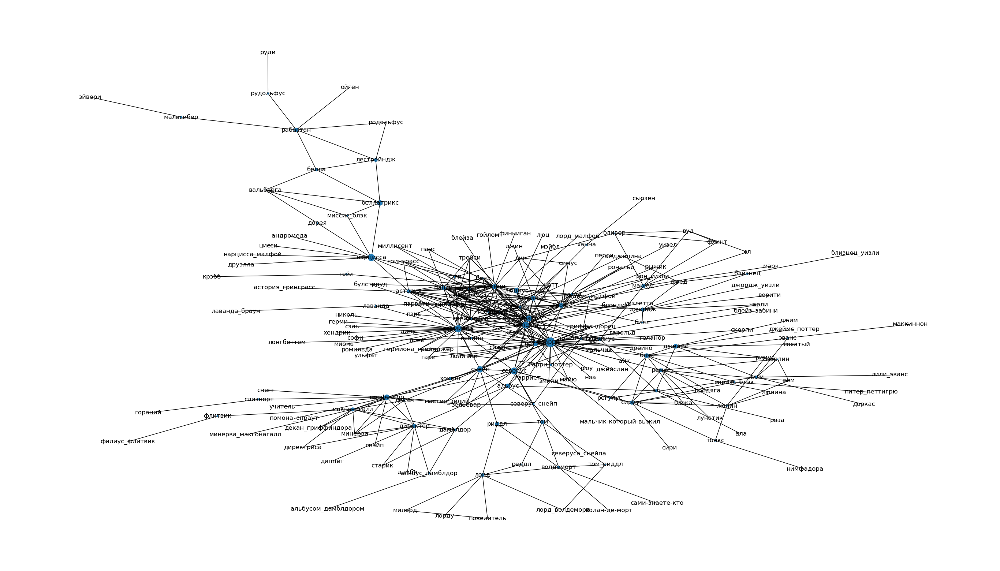

In [22]:
draw_graph(lg, ct)

Для взвешенного графа

In [23]:
ct = nx.load_centrality(lg, weight='similarity')
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.32711605584642234),
 ('северус', 0.18270069808027922),
 ('нарцисса', 0.16644851657940662),
 ('гермиона', 0.15401396160558464),
 ('малфой', 0.14201570680628273),
 ('поттер', 0.12843586387434555),
 ('люциус', 0.10716623036649214),
 ('беллатрикс', 0.09838568935427575),
 ('панси', 0.08464223385689354),
 ('профессор', 0.07891579406631763)]

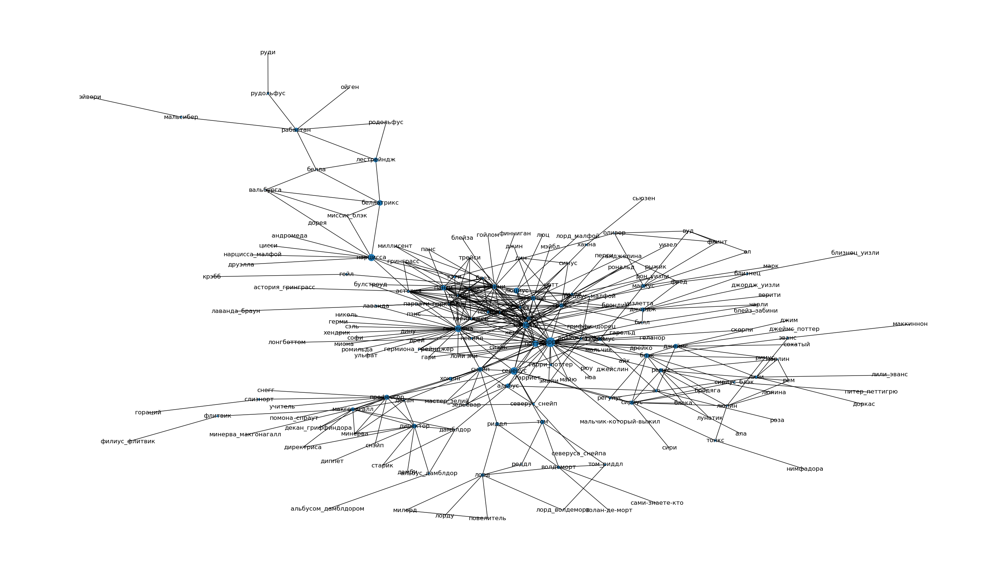

In [24]:
draw_graph(lg, ct)

К сожалению, у нас слишком маленький и простой граф, чтобы две данные метрики давали какие-то отличающиеся результаты. 

Как вы думаете, а на каком графе и при каких условиях была бы видимая разница?

***

Все меры, которые описаны выше, используют только информацию о вершине и ее связях, считая все остальные вершины одинаковыми с точки зрения важности связи с ними. Такой подход не совсем правильный для многих типов графов (в особенности для графов социальных отношений, с одним из которых мы сейчас и работаем). 

Другая группа мер основана на идее "чем важнее мои друзья, тем важнее я". К ней относятся следующие меры:
- Eigenvector centrality
- Katz centrality
- PageRank

Общий алгоритм подсчета:
- Начинаем с какой-то базовой оценки важности. Часто это просто одинаковые оценки у всех вершин
- Перебираем все вершины. Исходя из оценки важности всех смежных вершин, обновляем оценку у текущей вершины
- Повторяем предыдущий пункт много раз, пока не достигнем какого-то условия (чаще всего кол-во итераций). Итеравтиное потворение будет делать важные вершины все более важными, а неважные - все более неважными. По идее, хороший алгоритм в какой-то момент все-таки стабилизируется.

Давайте посмотрим, какие мы получим результаты.

**Eigenvector centrality**

Было на лекции как мера влиятельности

In [25]:
ct = nx.eigenvector_centrality(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]
# очень иронично, что у Мафлоя (и вообще ребят из Слизерина) больше всего влиятельных друзей :)

[('драко', 0.3074061845802009),
 ('малфой', 0.30690711316841607),
 ('гермиона', 0.2737107657002028),
 ('забини', 0.24522516226219288),
 ('блейз', 0.24409608611449088),
 ('тео', 0.23522096108957127),
 ('гарри', 0.23217453136445126),
 ('грейнджер', 0.22155168355385116),
 ('дафна', 0.2183529262587174),
 ('панси', 0.21244777511839455)]

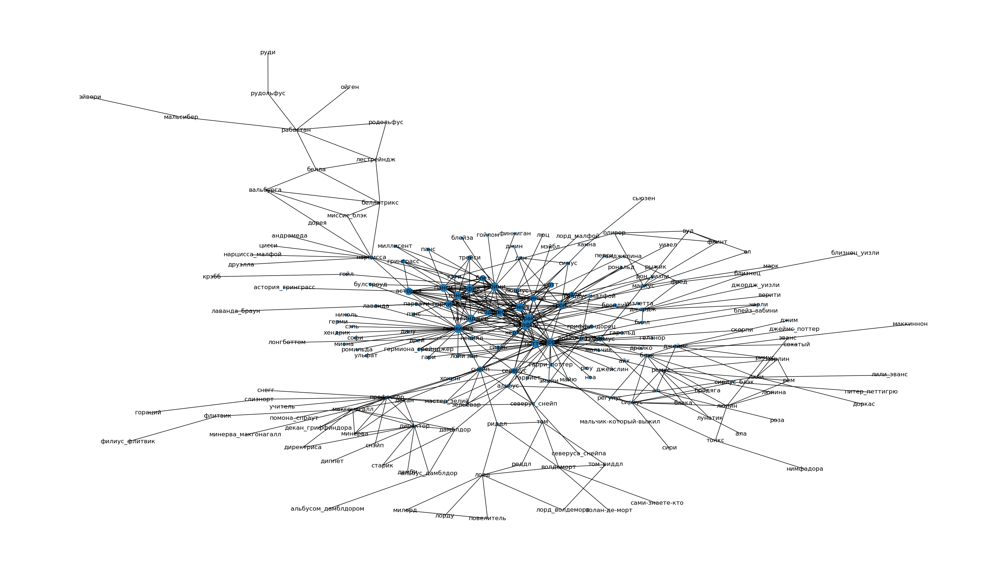

In [26]:
draw_graph(lg, ct)

**PageRank**

Изначально разработано для задачи ранжирования и оценки документов в поисковой системе, поэтому чаще всего формулируется в терминологии ссылок и документов.

Общая идея:
- Чем больше документов, на которые ссылается данный, тем меньше ценность его ссылки (документ-агрегатор имеет почти нулевую информационную ценность)
- Чем больше “дорогих” ссылок у документа, тем выше его уровень важности (если на вас ссылаются серьезные источники, то вы скорее всего тоже пишете что-то важное)
- Метрика считается со случайного документа итеративно 

In [27]:
# а вот в пользовательском голосовании Поттер однозначно победил
ct = nx.pagerank(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('гарри', 0.03900202373850837),
 ('гермиона', 0.0338209204368705),
 ('малфой', 0.028139221132646355),
 ('драко', 0.02211433840066465),
 ('забини', 0.021952835048394365),
 ('рон', 0.02040866837327369),
 ('профессор', 0.018140821635824457),
 ('поттер', 0.017374295708686534),
 ('джинни', 0.014452599171845217),
 ('директор', 0.014420532447527978)]

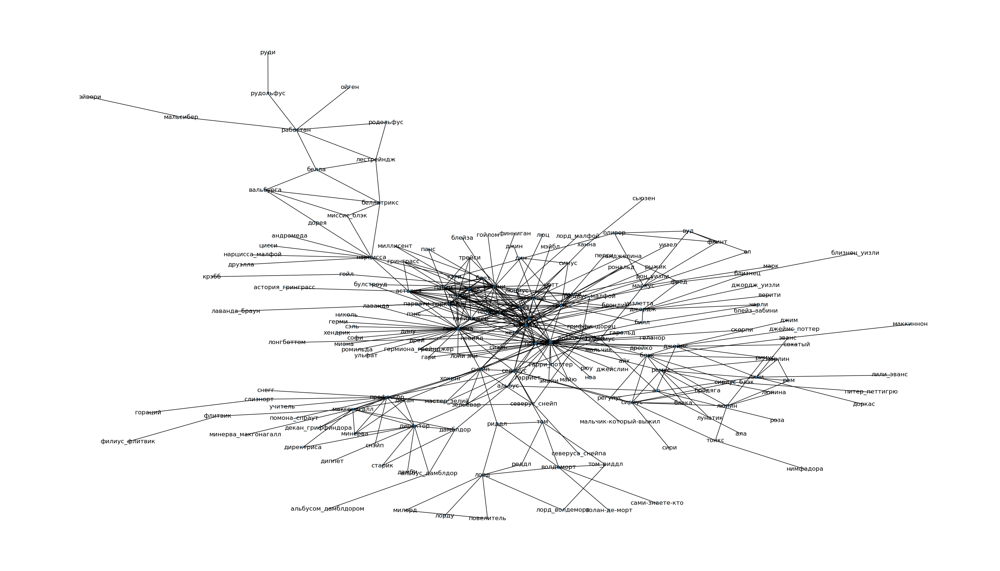

In [28]:
draw_graph(lg, ct)

## Меры кластерности

Мера кластерности позволяет оценить, насколько "кучно" расположены вершины в графе. Это очень полезная мера, однако как и многие, описанные выше, для больших графов она может быть вычислетельно очень тяжелой

Давайте создадим полный граф и случайный граф, чтобы нам было, с чем сравниваться

In [29]:
gfull = nx.complete_graph(lg.nodes())
grand = nx.connected_watts_strogatz_graph(lg.number_of_nodes(), lg.number_of_edges() * 2 // lg.number_of_nodes(), 
                                          0.5, tries=100, seed=42)
grand = nx.relabel_nodes(grand, {i: node for i, node in enumerate(lg.nodes())})

**Triangles**

Считает кол-во треугольников (набор из трех вершин со всеми возможными связями между ними), в которые входит вершина

In [30]:
ct = nx.triangles(gfull)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:5]

[('ал', 18336),
 ('регулус', 18336),
 ('рон', 18336),
 ('сами-знаете-кто', 18336),
 ('лорд', 18336)]

In [31]:
ct = nx.triangles(grand)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:5]

[('ноа', 4), ('сириус_блэк', 3), ('ол', 3), ('лаванда', 3), ('лонгботтом', 3)]

In [32]:
ct = nx.triangles(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:5]

[('драко', 120),
 ('малфой', 113),
 ('гермиона', 88),
 ('забини', 81),
 ('блейз', 78)]

**Transitivity**

$T = 3\frac{\#triangles}{\#triads}$

Где триада - это два ребра с общей вершиной (треугольник без одного ребра)

In [33]:
nx.transitivity(gfull), nx.transitivity(grand)

(1.0, 0.07644787644787644)

In [34]:
nx.transitivity(lg)

0.29876796714579057

**Clustering**

Для не взвешенного графа:

$c_u = \frac{2 T(u)}{deg(u)(deg(u)-1)}$, где

- $T(u)$ - кол-во треугольников, проходящих через вершину u
- $deg(u)$ - степень вершины u


Для взвешенного графа:

$c_u = \frac{1}{deg(u)(deg(u)-1))}
      \sum_{vw} (\hat{w}_{uv} \hat{w}_{uw} \hat{w}_{vw})^{1/3}$, где

- $\hat{w}_{uv}$ - нормализованный на максимум по графу вес ребра (u, v)
- $deg(u)$ - степень вершины u

In [35]:
ct = nx.clustering(gfull)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:5]

[('ал', 1.0),
 ('регулус', 1.0),
 ('рон', 1.0),
 ('сами-знаете-кто', 1.0),
 ('лорд', 1.0)]

In [36]:
ct = nx.clustering(grand)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:5]

[('джим', 1.0),
 ('сэль', 1.0),
 ('флитвик', 1.0),
 ('повелитель', 0.6666666666666666),
 ('нарцисса', 0.6666666666666666)]

In [37]:
ct = nx.clustering(lg)
sorted(ct.items(), key=lambda x: x[1], reverse=True)[25:35]

[('люпина', 1.0),
 ('гриффиндорец', 1.0),
 ('гарольд', 1.0),
 ('керли', 1.0),
 ('нотт', 0.9333333333333333),
 ('трейси', 0.8333333333333334),
 ('зельевар', 0.8333333333333334),
 ('паркинсон', 0.7727272727272727),
 ('теодор', 0.7111111111111111),
 ('декан', 0.7)]

In [38]:
ct = nx.clustering(lg, weight='similarity')
sorted(ct.items(), key=lambda x: x[1], reverse=True)[:10]

[('блондин', 0.7819981514933465),
 ('бродяга', 0.7080337486168096),
 ('гарольд', 0.7018000235258658),
 ('мальчик', 0.699455108113726),
 ('флинт', 0.6925104994592753),
 ('рональд', 0.6905992423587002),
 ('старик', 0.6768096178498506),
 ('блэка', 0.6666543318098587),
 ('гриффиндорец', 0.6646563924161838),
 ('люпина', 0.6613111102553382)]

## *Кратко про случайный граф

Выше мы использовали случайный граф с некими параметрами, которые достаточно сильно влияли на его характеристики. Более того, если вы зайдете в соответствующую вкладку [документации networkx](https://networkx.org/documentation/stable/reference/generators.html#module-networkx.generators.random_graphs), то увидите, то даже самих алгоритмов генерации графов множество, не говоря уже о параметрах каждого из них.

Я выше использовала функцию `nx.connected_watts_strogatz_graph`, которая генирует граф малого мира на основе модели Уоттса – Строгаца (надеюсь, я правильно транслитерировала...; Watts–Strogatz model на английском). У графов малого мира есть множество интересных свойств, но одно из самых известных выглядит следующим образом

${\displaystyle L\propto \log N}$

и означает, что средняя длина кратчайшего пути в графе (мат. ожидание длины кратчайшего пути) растет как логарифм от количества вершин в графе. Фактически, это математическая формулировка "теории шести рукопожатий".

Модель Уоттса – Строгаца позволяет генерировать случайные графы, которые однако сохраняют свойтсва графов малого мира. Алгоритм требует ручной устоновки следующих парамтеров:
- N - количествов вершин в графе
- k - средняя степень вершины в графе, ожидается, что будет четным и будет удовлетворять условию ${\displaystyle N\gg K\gg \ln N\gg 1}$
- p - вероятность установки связи, ${\displaystyle 0\leq p \leq 1}$

В итоговом графе будет $\frac{N K}{2}$ ребер